# МАРКЕТИНГОВАЯ АНАЛИТИКА ДЛЯ САЙТА АФИША

В нашем распоряжении имеются данные сайта, реализующего билеты на мероприятия (театры, кино, концерты и пр. - далее "Афиша") с июня 2017 по конец мая 2018 года:
- лог сервера с данными о посещениях сайта Афиши,
- выгрузка всех заказов за этот период,
- статистика рекламных расходов.

В рамках данного исследования нам предстоит изучить как клиенты пользуются сервисом, когда делают первые покупки на сайте, сколько денег приносит компании каждый клиент, когда окупаются расходы на привлечение клиента.

Цель исследования - сформулировать рекомендации отделу маркетинга по источникам привлечения трафика: от каких источников следует отказаться в виду их низкой эффективности и как лучше перераспределить рекламный бюджет.

## Ознакомление с данными

Импортируем необходимые библиотеки и прочитаем файлы с данными

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import warnings

In [2]:
visits = pd.read_csv('https://code.s3.yandex.net/datasets/visits_log.csv')   
orders = pd.read_csv('https://code.s3.yandex.net/datasets/orders_log.csv') 
costs = pd.read_csv('https://code.s3.yandex.net/datasets/costs.csv') 

В нашем распоряжении 3 файла с данными. Чтобы взглянуть на данные и определить, имеются ли в них проблемы (некорректный тип данных, пропуски, дубликаты и прочее), используем функцию *first_glance*

In [3]:
def first_glance(data):
    print('------------------------------------------')
    display(data)
    print('------------------------------------------')
    data.info(memory_usage='deep')
    print('------------------------------------------')
    print('Количество дубликатов в датасете:', data.duplicated().sum())
    print('------------------------------------------')

first_glance(visits)

------------------------------------------


,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485


------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 79.3 MB
------------------------------------------
Количество дубликатов в датасете: 0
------------------------------------------


Датасет `visits` представляет собой лог сервера с данными о посещениях сайта Афиши.  

Структура датасета:  
- `Uid` — уникальный идентификатор пользователя,  
- `Device` — категория устройства пользователя,  
- `Start Ts` — дата и время начала сессии,  
- `End Ts` — дата и время окончания сессии,  
- `Source Id` — идентификатор источника перехода на сайт.  

Всего 359 400 строк. Пропусков и дубликатов нет.

Столбцы с информацией о начале и окончании сессии имеют строковый тип. Для работы с ними мы изменим тип данных на datetime.
Названия столбцов для удобства приведем к нижнему регистру, и в качестве разделителя используем нижнее подчеркивание вместо пробела.

Отдельно изучим устройства, с которых пользователи заходят на сайт

In [4]:
visits.columns = visits.columns.str.lower().str.replace(' ', '_')
visits['end_ts'] = pd.to_datetime(visits['end_ts'], format='%Y-%m-%d %H:%M:%S')
visits['start_ts'] = pd.to_datetime(visits['start_ts'], format='%Y-%m-%d %H:%M:%S')

visits['device'].value_counts()

desktop    262567
touch       96833
Name: device, dtype: int64

Со стационарного ПК на сайт Афиши заходит 262 567 пользователей, мобильными устройствами пользуются почти в три раза меньше - 96 833 пользователя. Других категорий устройств нет. В нашем исследовании мы не планируем использовать столбец `device`, поэтому в целях оптимизации можем преобразовать тип данных в категориальный.

In [5]:
visits['device'] = visits['device'].astype('category')
first_glance(visits)

------------------------------------------


,device,end_ts,source_id,start_ts,uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485


------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   device     359400 non-null  category      
 1   end_ts     359400 non-null  datetime64[ns]
 2   source_id  359400 non-null  int64         
 3   start_ts   359400 non-null  datetime64[ns]
 4   uid        359400 non-null  uint64        
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB
------------------------------------------
Количество дубликатов в датасете: 0
------------------------------------------


Названия колонок и тип данных в датах скорректированы. В результате преобразований мы также в 7 раз сократили объем используемой памяти.

Исследуем также распределение пользователей по источникам привлечения.

In [6]:
visitors_by_source = visits.groupby('source_id', as_index=False).agg({'uid':'nunique'})
visitors_by_source['share'] = (
    visitors_by_source['uid'] / visitors_by_source['uid'].sum()
).map(lambda x: "{0:.2f}".format(x))

visitors_by_source

,source_id,uid,share
0,1,18999,0.07
1,2,26245,0.09
2,3,74756,0.27
3,4,83525,0.30
4,5,56974,0.21
5,6,6,0.00
6,7,34,0.00
7,9,9264,0.03
8,10,8067,0.03


30% пользователей пришли из канала № 4, почти столько же привлек канал №3. 1/5 пользователей перешли по ссылке из канала № 5. Оставшиеся 22% пользователей распределились между источниками 1, 2, 9 и 10. Источники 6 и 7 привлекли небольшое количество пользователей (менее 1% от общего числа).

Посмотрим на датасет с заказами

In [7]:
first_glance(orders)

------------------------------------------


,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
50410,2018-05-31 23:50:00,4.64,12296626599487328624
50411,2018-05-31 23:50:00,5.80,11369640365507475976
50412,2018-05-31 23:54:00,0.30,1786462140797698849
50413,2018-05-31 23:56:00,3.67,3993697860786194247


------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Buy Ts   50415 non-null  object 
 1   Revenue  50415 non-null  float64
 2   Uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 4.4 MB
------------------------------------------
Количество дубликатов в датасете: 0
------------------------------------------


Датасет `orders` имеет следующую структуру:  
- `Uid` — уникальный идентификатор пользователя,  
- `Buy Ts` — дата и время заказа,  
- `Revenue` — сумма заказа.

Дубликатов и пропущенных значений нет.
Колонка с датой и временем заказа также имеет строковый тип, названия столбцов написаны с заглавной буквы с пробелом в качестве разделителя. Проведем необходимые преобразования.

In [8]:
orders.columns = orders.columns.str.lower().str.replace(' ', '_')
orders['buy_ts'] = pd.to_datetime(orders['buy_ts'], format='%Y-%m-%d %H:%M:%S')
orders.dtypes

buy_ts     datetime64[ns]
revenue           float64
uid                uint64
dtype: object

In [9]:
orders['revenue'].describe()

count    50415.000000
mean         4.999647
std         21.818359
min          0.000000
25%          1.220000
50%          2.500000
75%          4.890000
max       2633.280000
Name: revenue, dtype: float64

В столбце с выручкой значения неотрицательные, есть экстремально большие цифры - чуть позже мы проанализируем данный столбец более детально и выясним, являются ли такие значения ошибкой или это выручка от сверхдоходных клиентов.

Итак, данные о заказах подготовлены. Исследуем затраты

In [10]:
first_glance(costs)

------------------------------------------


,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08
...,...,...,...
2537,10,2018-05-27,9.92
2538,10,2018-05-28,21.26
2539,10,2018-05-29,11.32
2540,10,2018-05-30,33.15


------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   source_id  2542 non-null   int64  
 1   dt         2542 non-null   object 
 2   costs      2542 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 206.2 KB
------------------------------------------
Количество дубликатов в датасете: 0
------------------------------------------


Датасет `costs` содержит 2542 записи, пропусков и дубликатов нет. Названия столбцов написаны в нижнем регистре с нужным нам разделителем, корректировка не требуется.

Структура датасета:  
- `source_id` — идентификатор рекламного источника,  
- `dt` — дата проведения рекламной кампании,  
- `costs` — расходы на эту кампанию.

Столбец с датой необходимо привести к типу datetime

In [11]:
costs['dt'] = pd.to_datetime(costs['dt'], format='%Y-%m-%d')
costs.dtypes

source_id             int64
dt           datetime64[ns]
costs               float64
dtype: object

Итак, мы ознакомились с датасетами, проверили на наличие пропусков и дубликатов, привели данные к нужному типу. Данные готовы к анализу.

## Продуктовые метрики

### Количество пользователей

In [12]:
visits['start_ts'].min()
visits['end_ts'].max()

Timestamp('2017-06-01 00:01:00')

Timestamp('2018-06-01 01:26:00')

Первая сессия в наших логах зафиксирована 1 июня 2017 года, последняя сессия завершилась 1 июня 2018 года. Важно помнить, что из июня 2018 в выборку попал только один день, значит этот месяц не нужно учитывать при формулировании выводов.

Найдем количество новых пользователей сервиса в день, неделю, месяц (метрики DAU, WAU, MAU). Для этого выделим из даты день, неделю и месяц 

In [13]:
visits['date'] = visits['start_ts'].astype('datetime64[D]')
visits['first_day_of_week'] = (
    (pd.to_datetime(visits['start_ts']) - pd.TimedeltaIndex(visits['start_ts'].dt.dayofweek,unit='d')
    ).astype('datetime64[W]')
)
visits['first_day_of_month'] = visits['start_ts'].astype('datetime64[M]')

visits.head()
visits.info()

,device,end_ts,source_id,start_ts,uid,date,first_day_of_week,first_day_of_month
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,2017-12-14,2017-12-01
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,2018-02-15,2018-02-01
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017-06-22,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,2018-05-10,2018-05-01
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017-12-21,2017-12-01


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 8 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   device              359400 non-null  category      
 1   end_ts              359400 non-null  datetime64[ns]
 2   source_id           359400 non-null  int64         
 3   start_ts            359400 non-null  datetime64[ns]
 4   uid                 359400 non-null  uint64        
 5   date                359400 non-null  datetime64[ns]
 6   first_day_of_week   359400 non-null  datetime64[ns]
 7   first_day_of_month  359400 non-null  datetime64[ns]
dtypes: category(1), datetime64[ns](5), int64(1), uint64(1)
memory usage: 19.5 MB


#### DAU

Для расчета количества пользователей в день сгруппируем данные по дате посещения

In [14]:
dau = visits.groupby('date').agg({'uid':'nunique'}).reset_index()
dau.columns = ['date', 'dau']
dau
print(f"Среднее значение метрики DAU за период: {int(dau['dau'].mean().round())} пользователей")

,date,dau
0,2017-06-01,605
1,2017-06-02,608
2,2017-06-03,445
3,2017-06-04,476
4,2017-06-05,820
...,...,...
359,2018-05-27,620
360,2018-05-28,1039
361,2018-05-29,948
362,2018-05-30,1289


Среднее значение метрики DAU за период: 908 пользователей


Для удобства отображения изменения метрик на графике создадим функцию *lineplot*. Визуализируем изменение DAU

In [15]:
def lineplot(df, date, value):
    x = df[date]
    y = df[value]

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=x, y=y, line_shape='linear'))
    annotations = []
    annotations.append(dict(xref='paper', yref='paper', x=0.5, y=1.05,
                              xanchor='center', yanchor='bottom',
                              text=value,
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
    fig.update_layout(annotations=annotations,
                     xaxis_title=date,
                  yaxis_title=value)
    fig.show();

In [16]:
lineplot(dau, 'date', 'dau')

Итак, среднее количество пользователей в день - 908. С октября 2017 по март 2018 сайт ежедневно посещали более 1000 пользователей (а в некоторые дни более 1500). Пиковая посещаемость была 24 ноября 2017 года - 3319 человек.

Меньше всего пользователей было 31 марта 2018 года - всего 1 человек. В этот день, скорее всего, сайт не функционировал по техническим причинам. Поскольку после 31 марта вплоть до 31 мая количество посетителей сайта не достигало домартовских значений, мы можем сделать вывод, что техническая неполадка, если она имела место, оказала серьезное влияние на посещаемость сайта, а значит сервис недополучил прибыль. 

Для снижения репутационных рисков и сокращения размера упущенной выгоды в будущем рекомендуем получить у службы поддержки сайта максимум информации о возникшем инциденте, его причинах и способах устранения, совместно разработать/доработать мероприятия по недопущению подобных ситуаций.

#### WAU

Расчитаем количество пользователей в неделю и отразим изменение метрики на графике

In [17]:
wau = visits.groupby('first_day_of_week').agg({'uid':'nunique'}).reset_index()
wau.columns = ['first_day_of_week', 'wau']
wau.head(10)
print(f"Среднее значение метрики WAU за период: {int(wau['wau'].mean().round())} пользователей")

,first_day_of_week,wau
0,2017-05-25,2021
1,2017-06-01,4129
2,2017-06-08,2812
3,2017-06-15,2878
4,2017-06-22,3064
5,2017-06-29,3294
6,2017-07-06,4355
7,2017-07-13,3841
8,2017-07-20,2655
9,2017-07-27,2364


Среднее значение метрики WAU за период: 5716 пользователей


In [18]:
lineplot(wau, 'first_day_of_week', 'wau')

В неделю сайт посещают около 5716 человек. График изменения метрики напоминает график DAU (пик в 10.5 тыс человек на предпоследней неделе ноября), только минимальные значения зафиксированы в июне и июле 2017 года (чуть более 2 тыс человек).

Интересно, что резкое падение количества дневных пользователей 31 марта не оказало критического влияния на среднее число пользователей в неделю - показатель держался выше 3900 пользователей, что намного выше значений лета 2017 года.

#### MAU

Найдем среднее количество посетителей сайта в месяц, отобразим на графике

In [19]:
mau = visits.groupby('first_day_of_month').agg({'uid':'nunique'}).reset_index()
mau.columns = ['first_day_of_month', 'mau']
mau
print(f"Среднее значение метрики MAU за период: {int(mau['mau'].mean().round())} пользователей")

,first_day_of_month,mau
0,2017-06-01,13259
1,2017-07-01,14183
2,2017-08-01,11631
3,2017-09-01,18975
4,2017-10-01,29692
5,2017-11-01,32797
6,2017-12-01,31557
7,2018-01-01,28716
8,2018-02-01,28749
9,2018-03-01,27473


Среднее значение метрики MAU за период: 23228 пользователей


In [20]:
lineplot(mau, 'first_day_of_month', 'mau')

23228 человек в среднем заходят на сайт ежемесячно. Минимальные значения наблюдались в августе 2017, максимум - в ноябре. Скорее всего мы имеем дело с сезонностью - в декабре и январе проходит много мероприятий, связанных с празднованием нового года и рождества, длинные новогодние каникулы, когда люди могут себе позволить чаще ходить в кино, театр и посещать другие развлекательные мероприятия. Поэтому в октябре-ноябре возрастает спрос на билеты - и мы наблюдаем пиковые значения посещаемости сайта Афиша. Для более точного анализа влияния сезонного фактора рекомендуется использовать для исследования данные за более длительный период (3-5 лет).

Для оценки вовлеченности аудитории расчитаем Sticky Factor, используя следующие формулы:
- Sticky Factor за неделю $=\dfrac{DAU}{WAU}\times 100\%$;
- Sticky Factor за месяц $=\dfrac{DAU}{MAU}\times 100\%$.

In [21]:
week_sticky_factor = dau['dau'].mean() / wau['wau'].mean()
print('Недельный Sticky Factor: {:.0%}'.format(week_sticky_factor))
month_sticky_factor = dau['dau'].mean() / mau['mau'].mean()
print('Месячный Sticky Factor: {:.0%}'.format(month_sticky_factor))

Недельный Sticky Factor: 16%
Месячный Sticky Factor: 4%


Среднестатистический пользователь заходил на сайт Афиши чуть более 1 дня в течение недели ($7 * 16\% = 1.12$)  и чуть более 1 дня в течение месяца ($30 * 4\% = 1.2$). Метрика тесно связана с retention - sticky factor будет тем выше, чем меньше пользователей будет покидать сервис в последующие недели и месяцы.

### Пользовательская сессия

#### Количество сессий на пользователя в день

Сгруппируем датасет по дням, посчитаем количество сессий и количество уникальных пользовательских ID за каждый день

In [22]:
sessions_per_user = visits.groupby('date').agg({'uid':['count', 'nunique']}).reset_index()
sessions_per_user.columns = ['day', 'n_sessions', 'n_users']
sessions_per_user.head()

,day,n_sessions,n_users
0,2017-06-01,664,605
1,2017-06-02,658,608
2,2017-06-03,477,445
3,2017-06-04,510,476
4,2017-06-05,893,820


Разделим количество сессий на количество уникальных ID

In [23]:
sessions_per_user['sessions_per_user'] = sessions_per_user['n_sessions'] / sessions_per_user['n_users']
sessions_per_user.head()
sessions_per_user['sessions_per_user'].mean().round(2)

,day,n_sessions,n_users,sessions_per_user
0,2017-06-01,664,605,1.097521
1,2017-06-02,658,608,1.082237
2,2017-06-03,477,445,1.071910
3,2017-06-04,510,476,1.071429
4,2017-06-05,893,820,1.089024


1.08

Мы выяснили, что каждый пользователь в среднем совершает чуть более 1 сессии в день.  
Отразим изменение показателя на графике

In [24]:
lineplot(sessions_per_user, 'day', 'sessions_per_user')

Максимальное значение показатель принимал 24 ноября 2017 года (1.22 сессии), высокие значения также наблюдались 28 ноября 2017 и 1 февраля 2018 года, минимум - 31 марта 2018 года (1 пользователь - 1 сессия).

#### Продолжительность сессии

Найдем среднюю продолжительность сессии в секундах

In [25]:
visits['session_dur_sec'] = (visits['end_ts'] - visits['start_ts']).dt.seconds
visits.head()
visits['session_dur_sec'].describe()

,device,end_ts,source_id,start_ts,uid,date,first_day_of_week,first_day_of_month,session_dur_sec
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,2017-12-14,2017-12-01,1080
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,2018-02-15,2018-02-01,1680
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017-06-22,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,2018-05-10,2018-05-01,1440
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017-12-21,2017-12-01,0


count    359400.000000
mean        643.506489
std        1016.334786
min           0.000000
25%         120.000000
50%         300.000000
75%         840.000000
max       84480.000000
Name: session_dur_sec, dtype: float64

Мы получили колонку с информацией о длительности каждой сессии. 
Около четверти сессий не превышает 2 минут, половина длится не более 5 минут (на наш взгляд, этого времени вполне достаточно, чтобы ознакомиться с информацией, сделать выбор и оформить заказ).  
Длина самой продолжительной сессии составила 84 480 секунд, это почти 24 часа (пользователь мог в это время не совершать никаких действий - просто забыл закрыть страницу). 

В логах присутствуют записи о сессиях длиной 0 секунд. Причина появления таких записей может быть в том, что столбцы `end_ts` и `start_ts` не содержат информации о секундах, значит длина сессии менее 60 секунд не фиксируется, и при вычитании одного значения из другого мы получаем ноль. Узнаем сколько таких записей.

In [26]:
null_sessions_part = visits[visits['session_dur_sec'] == 0]['session_dur_sec'].count() / len(visits)
print("Доля сессий продолжительностью 0 секунд - {:.0%}".format(null_sessions_part))

Доля сессий продолжительностью 0 секунд - 10%


Доля таких сессий - 10% от всего числа.
Посмотрим, как распределены сессии по длительности

In [27]:
x = visits['session_dur_sec']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x, xbins=dict(start=-1.0, end=2000.0), marker_color='rgb(100,17,54)'))
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.5, y=1.05,
                              xanchor='center', yanchor='bottom',
                              text='SESSION LENGHT',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations,
                  xaxis_title='session length',
                  yaxis_title='frequency')
fig.show();

Распределение явно отличается от нормального - у нас очень много коротких сессий (< 60, 60, 120 и 180 секунд) и мало длинных. В данном случае в качестве среднего значения лучше использовать моду, а не среднее арифметическое, на которое оказывают влияние выбросы. Мода покажет какое значение встречается чаще всего.

In [28]:
visits['session_dur_sec'].mode()

0    60
dtype: int64

Чаще всего пользователи проводят на сайте 1 минуту, второе по частоте значение - менее 1 минуты ("нулевые сессии") и 2 минуты. Получается, что значительная часть пользователей приходит на сайт с вполне конкретной целью - получить информацию об интересующем мероприятии или приобрести билеты на него. Тех, кто подолгу "зависает" на страничке и изучает ее содержимое, не так много. К сожалению, у нас недостаточно информации о том, какие действия совершают пользователи на странице сайта, поэтому мы не можем на данном этапе составить более полную картину или проанализировать воронку продаж.

### Retention Rate

Для расчета % удержания пользователей нам потребуется разделить их на когорты по дате первого визита. Найдем такую дату для каждого пользователя

In [29]:
first_session = visits.groupby('uid').agg({'start_ts':'min'}).reset_index()
first_session.columns = ['uid', 'first_session_ts']
first_session

,uid,first_session_ts
0,11863502262781,2018-03-01 17:27:00
1,49537067089222,2018-02-06 15:55:00
2,297729379853735,2017-06-07 18:47:00
3,313578113262317,2017-09-18 22:49:00
4,325320750514679,2017-09-30 14:29:00
...,...,...
228164,18446403737806311543,2017-11-30 03:36:00
228165,18446424184725333426,2017-12-06 20:32:00
228166,18446556406699109058,2018-01-01 16:29:00
228167,18446621818809592527,2017-12-27 13:27:00


In [30]:
vis = pd.merge(first_session, visits, on='uid')
vis.head()

,uid,first_session_ts,device,end_ts,source_id,start_ts,date,first_day_of_week,first_day_of_month,session_dur_sec
0,11863502262781,2018-03-01 17:27:00,touch,2018-03-01 17:33:00,3,2018-03-01 17:27:00,2018-03-01,2018-02-22,2018-03-01,360
1,49537067089222,2018-02-06 15:55:00,touch,2018-02-06 15:57:00,2,2018-02-06 15:55:00,2018-02-06,2018-02-01,2018-02-01,120
2,297729379853735,2017-06-07 18:47:00,desktop,2017-06-07 18:48:00,3,2017-06-07 18:47:00,2017-06-07,2017-06-01,2017-06-01,60
3,313578113262317,2017-09-18 22:49:00,desktop,2018-03-11 17:29:00,2,2018-03-11 17:23:00,2018-03-11,2018-03-01,2018-03-01,360
4,313578113262317,2017-09-18 22:49:00,desktop,2017-09-18 23:07:00,2,2017-09-18 22:49:00,2017-09-18,2017-09-14,2017-09-01,1080


Определим на каком этапе жизненного цикла находится пользователь в момент каждого входа на сайт. Поскольку наш датасет содержит данные за год, в качестве периода lifеtime мы будем использовать месяц

In [31]:
vis.dtypes

uid                           uint64
first_session_ts      datetime64[ns]
device                      category
end_ts                datetime64[ns]
source_id                      int64
start_ts              datetime64[ns]
date                  datetime64[ns]
first_day_of_week     datetime64[ns]
first_day_of_month    datetime64[ns]
session_dur_sec                int64
dtype: object

In [32]:
vis['first_session_month'] = vis['first_session_ts'].astype('datetime64[M]')
vis.head()

,uid,first_session_ts,device,end_ts,source_id,start_ts,date,first_day_of_week,first_day_of_month,session_dur_sec,first_session_month
0,11863502262781,2018-03-01 17:27:00,touch,2018-03-01 17:33:00,3,2018-03-01 17:27:00,2018-03-01,2018-02-22,2018-03-01,360,2018-03-01
1,49537067089222,2018-02-06 15:55:00,touch,2018-02-06 15:57:00,2,2018-02-06 15:55:00,2018-02-06,2018-02-01,2018-02-01,120,2018-02-01
2,297729379853735,2017-06-07 18:47:00,desktop,2017-06-07 18:48:00,3,2017-06-07 18:47:00,2017-06-07,2017-06-01,2017-06-01,60,2017-06-01
3,313578113262317,2017-09-18 22:49:00,desktop,2018-03-11 17:29:00,2,2018-03-11 17:23:00,2018-03-11,2018-03-01,2018-03-01,360,2017-09-01
4,313578113262317,2017-09-18 22:49:00,desktop,2017-09-18 23:07:00,2,2017-09-18 22:49:00,2017-09-18,2017-09-14,2017-09-01,1080,2017-09-01


Из месяца визита вычтем месяц первого визита - так мы получим "возраст" пользователя когорты

In [33]:
vis['cohort_lifetime'] = (vis['first_day_of_month'] - vis['first_session_month']) / np.timedelta64(1, 'M')
vis['cohort_lifetime'] = vis['cohort_lifetime'].round().astype('int')

vis.sample(5)

,uid,first_session_ts,device,end_ts,source_id,start_ts,date,first_day_of_week,first_day_of_month,session_dur_sec,first_session_month,cohort_lifetime
74794,3824054258858370375,2017-08-30 15:50:00,desktop,2017-08-30 15:51:00,5,2017-08-30 15:50:00,2017-08-30,2017-08-24,2017-08-01,60,2017-08-01,0
64160,3313500988072329915,2017-10-17 10:08:00,touch,2017-12-29 08:53:00,5,2017-12-29 08:37:00,2017-12-29,2017-12-21,2017-12-01,960,2017-10-01,2
87341,4470721350285713466,2017-11-12 21:11:00,desktop,2017-11-12 21:27:00,3,2017-11-12 21:11:00,2017-11-12,2017-11-02,2017-11-01,960,2017-11-01,0
41487,2135971817684829469,2017-12-12 18:10:00,desktop,2017-12-12 18:12:00,3,2017-12-12 18:10:00,2017-12-12,2017-12-07,2017-12-01,120,2017-12-01,0
124991,6424824883136968756,2017-10-06 20:44:00,touch,2017-10-06 20:53:00,5,2017-10-06 20:44:00,2017-10-06,2017-09-28,2017-10-01,540,2017-10-01,0


Сгруппируем пользователей по когортам и возрасту, посчитаем количество уникальных id

In [34]:
cohorts = vis.groupby(['first_session_month', 'cohort_lifetime']).agg({'uid':'nunique'}).reset_index()
cohorts

,first_session_month,cohort_lifetime,uid
0,2017-06-01,0,13259
1,2017-06-01,1,1043
2,2017-06-01,2,713
3,2017-06-01,3,814
4,2017-06-01,4,909
...,...,...,...
73,2018-03-01,1,861
74,2018-03-01,2,557
75,2018-04-01,0,15709
76,2018-04-01,1,760


Расчитаем количество первичных пользователей в каждом месяце (число уникальных пользователей в "нулевых" когортах) и объединим с результатом предыдущего шага

In [35]:
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_session_month', 'uid']]
initial_users_count = initial_users_count.rename(columns={'uid': 'cohort_users'})
initial_users_count

,first_session_month,cohort_users
0,2017-06-01,13259
12,2017-07-01,13140
23,2017-08-01,10181
33,2017-09-01,16704
42,2017-10-01,25977
50,2017-11-01,27248
57,2017-12-01,25268
63,2018-01-01,22624
68,2018-02-01,22197
72,2018-03-01,20589


In [36]:
cohorts = cohorts.merge(initial_users_count, on='first_session_month')
cohorts

,first_session_month,cohort_lifetime,uid,cohort_users
0,2017-06-01,0,13259,13259
1,2017-06-01,1,1043,13259
2,2017-06-01,2,713,13259
3,2017-06-01,3,814,13259
4,2017-06-01,4,909,13259
...,...,...,...,...
73,2018-03-01,1,861,20589
74,2018-03-01,2,557,20589
75,2018-04-01,0,15709,15709
76,2018-04-01,1,760,15709


Найдем retention rate как отношение количества пользователей в месяце к количеству пользователей в нулевом месяце

In [37]:
cohorts['retention'] = cohorts['uid'] / cohorts['cohort_users']
cohorts['retention'] = cohorts['retention'].round(3)
cohorts.head()

,first_session_month,cohort_lifetime,uid,cohort_users,retention
0,2017-06-01,0,13259,13259,1.000
1,2017-06-01,1,1043,13259,0.079
2,2017-06-01,2,713,13259,0.054
3,2017-06-01,3,814,13259,0.061
4,2017-06-01,4,909,13259,0.069


In [38]:
retention_pivot = cohorts.pivot_table(
index='first_session_month',
columns='cohort_lifetime',
values='retention',
aggfunc='sum',
)

retention_pivot.fillna('')

cohort_lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_session_month,,,,,,,,,,,,
2017-06-01,1.0,0.079,0.054,0.061,0.069,0.071,0.061,0.058,0.052,0.051,0.041,0.045
2017-07-01,1.0,0.056,0.051,0.056,0.058,0.048,0.045,0.046,0.039,0.029,0.027,
2017-08-01,1.0,0.077,0.063,0.063,0.05,0.044,0.036,0.039,0.028,0.026,,
2017-09-01,1.0,0.085,0.069,0.051,0.039,0.038,0.036,0.024,0.023,,,
2017-10-01,1.0,0.079,0.052,0.039,0.034,0.032,0.021,0.02,,,,
2017-11-01,1.0,0.078,0.044,0.039,0.034,0.023,0.022,,,,,
2017-12-01,1.0,0.056,0.038,0.031,0.02,0.019,,,,,,
2018-01-01,1.0,0.06,0.039,0.025,0.02,,,,,,,
2018-02-01,1.0,0.057,0.025,0.02,,,,,,,,


Отобразим результаты с помощью тепловой карты

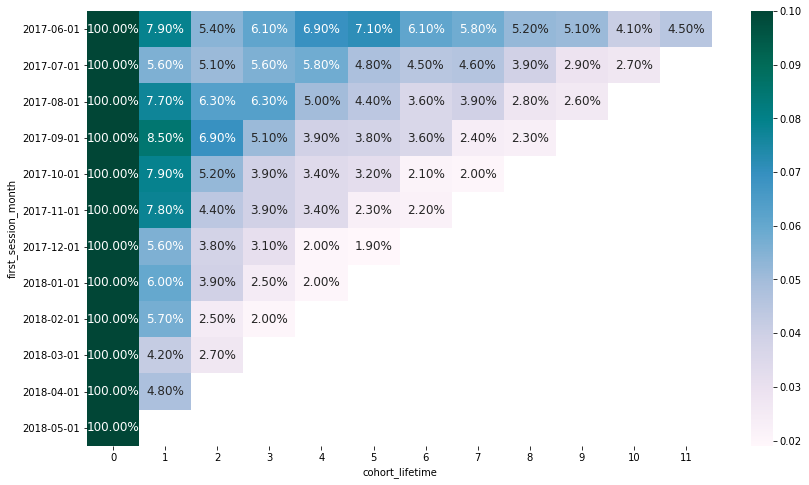

In [39]:
plt.figure(figsize=(14,8))

ax = sns.heatmap(
    retention_pivot, 
    annot = True,
    fmt = '.2%',
    cmap='PuBuGn',
    vmax=.1,
    annot_kws={'fontsize':12}
)
ticklabels = [retention_pivot.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels);

По итогам второго месяца самый высокий коэффициент удержания наблюдается у пользователей, пришедших на сайт в сентябре 2017 года (8.5%). Однако спустя 9 месяцев всего 2.3% от первоначального состава когорты пользуются сервисом.

Также хорошо проявили себя когорты июня, августа, октября и ноября (здесь повторно посещают сайт спустя месяц после первого входа более 7.7% пользователей).

Когорта июня 2017 года пользовалась сервисом дольше всех, и по прошествии года 4.5% первоначальных пользователей все еще сохраняли лояльность - это самый лучший показатель на конец жизни когорты.

В целом заметно, что лояльность пользователей, пришедших на сайт в 2017 году, выше, чем у тех, кто впервые заглянул на страничку Афиши в начале 2018-го.

Найдем средний показатель удержания по всем когортам

In [40]:
retention_mean = cohorts.groupby('cohort_lifetime')['retention'].mean().round(3).reset_index()
retention_mean

print(
    'Retention второго месяца {:.1%}'.format(retention_mean[retention_mean['cohort_lifetime'] == 1]['retention'][1])
)

,cohort_lifetime,retention
0,0,1.000
1,1,0.065
2,2,0.046
3,3,0.043
4,4,0.040
5,5,0.039
6,6,0.037
7,7,0.037
8,8,0.036
9,9,0.035


Retention второго месяца 6.5%


Второй месяц жизни был самым важным для когорт. Средний retention второго месяца равен 6.5%

In [41]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=retention_mean['cohort_lifetime'], 
    y=retention_mean['retention'],
    mode='lines+markers')
             )

annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.5, y=1.05,
                              xanchor='center', yanchor='bottom',
                              text='RETENTION IN DYNAMICS',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations, 
                  xaxis_title='cohort lifetime',
                  yaxis_title='mean retention')

fig.show();

Только 6.5% пользователей повторно заходят на сервис через месяц после первого визита. На третий месяц их уже 5%. Все остальное время средний retention rate около 4.6%.

Итак, мы изучили метрики, характеризующие количество пользователей в день / неделю / месяц, среднюю продолжительность пользовательской сессии, количество сессий в день. Эти данные позволяют нам лучше понять наш продукт, найти зоны уязвимости и точки роста. Наблюдение показателей в динамике позволит понять эффективность вносимых улучшений и вовремя среагировать, если что-то пойдет не так.

Также мы расчитали коэффициент удержания клиентов в разрезе когорт и для всего сервиса. Доля пользователей, лояльных к сервису на протяжении года - более 3.4%. Много это или мало - на данном этапе исследования сказать сложно. Рекомендуем следить за метрикой на регулярной основе, при наличии информации - сравнить с аналогичными показателями схожих видов бизнеса, и работать над улучшением retention rate.

## Метрики электронной коммерции

### Время до первого заказа

In [42]:
orders.head()

,buy_ts,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


Определим дату первой покупки для каждого пользователя

In [43]:
first_orders = orders.groupby('uid').agg({'buy_ts':'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_ts']
first_orders['first_order_dt'] = first_orders['first_order_ts'].dt.date
first_orders['first_order_month'] = first_orders['first_order_ts'].astype('datetime64[M]')
first_orders.head()

,uid,first_order_ts,first_order_dt,first_order_month
0,313578113262317,2018-01-03 21:51:00,2018-01-03,2018-01-01
1,1575281904278712,2017-06-03 10:13:00,2017-06-03,2017-06-01
2,2429014661409475,2017-10-11 18:33:00,2017-10-11,2017-10-01
3,2464366381792757,2018-01-28 15:54:00,2018-01-28,2018-01-01
4,2551852515556206,2017-11-24 10:14:00,2017-11-24,2017-11-01


Для расчета времени до первого заказа нам потребуются даты первого посещения сайта - они у нас уже есть

In [44]:
first_session['first_session_dt'] = first_session['first_session_ts'].dt.date
first_session.head()

,uid,first_session_ts,first_session_dt
0,11863502262781,2018-03-01 17:27:00,2018-03-01
1,49537067089222,2018-02-06 15:55:00,2018-02-06
2,297729379853735,2017-06-07 18:47:00,2017-06-07
3,313578113262317,2017-09-18 22:49:00,2017-09-18
4,325320750514679,2017-09-30 14:29:00,2017-09-30


Объединим первые сессии, первые заказы и заказы в одну таблицу. Убедимся, что в результате группировки и слияния сумма общей выручки не изменилась

In [45]:
ord = pd.merge(first_orders, first_session, on='uid')
ord = pd.merge(orders, ord, on='uid')
ord.head()

orders['revenue'].sum().round(0) == ord['revenue'].sum().round(0)

,buy_ts,revenue,uid,first_order_ts,first_order_dt,first_order_month,first_session_ts,first_session_dt
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01 00:09:00,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01 00:14:00,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01 00:14:00,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01 07:31:00,2017-06-01


True

Приведем данные к нужному типу, найдем количество дней между первым входом на сайт и первым заказом

In [46]:
ord['first_order_dt'] = pd.to_datetime(ord['first_order_dt'])
ord['first_session_dt'] = pd.to_datetime(ord['first_session_dt'])
ord['days_to_first_order'] = (
    ord['first_order_ts'] - ord['first_session_ts']) / np.timedelta64(1, 'D')
ord['days_to_first_order'] = ord['days_to_first_order'].astype('int')
ord.head()
ord.dtypes

,buy_ts,revenue,uid,first_order_ts,first_order_dt,first_order_month,first_session_ts,first_session_dt,days_to_first_order
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01 00:09:00,2017-06-01,0
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01 00:14:00,2017-06-01,0
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,0
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01 00:14:00,2017-06-01,0
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01 07:31:00,2017-06-01,0


buy_ts                 datetime64[ns]
revenue                       float64
uid                            uint64
first_order_ts         datetime64[ns]
first_order_dt         datetime64[ns]
first_order_month      datetime64[ns]
first_session_ts       datetime64[ns]
first_session_dt       datetime64[ns]
days_to_first_order             int32
dtype: object

Посмотрим на распределение значений

In [47]:
ord['days_to_first_order'].describe([0.25, 0.5, 0.65, 0.9])
ord['days_to_first_order'].mode()

count    50415.000000
mean        17.419677
std         46.352290
min          0.000000
25%          0.000000
50%          0.000000
65%          0.000000
90%         63.000000
max        363.000000
Name: days_to_first_order, dtype: float64

0    0
dtype: int32

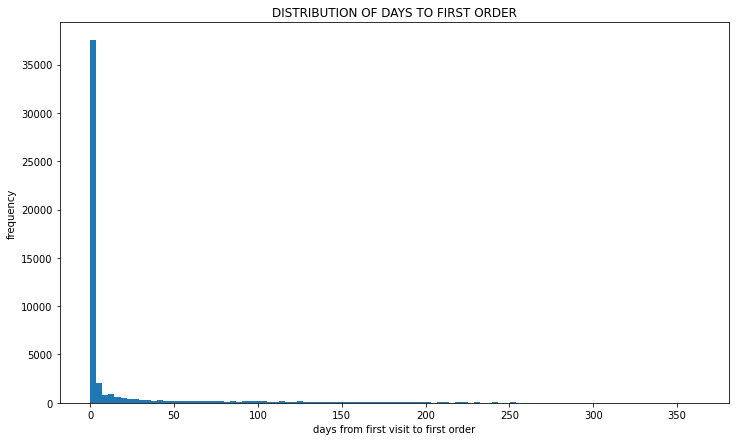

In [48]:
(ord['days_to_first_order'].plot(kind='hist', bins=100, figsize=(12, 7))).set(
    title='DISTRIBUTION OF DAYS TO FIRST ORDER',
    xlabel='days from first visit to first order',
    ylabel='frequency'
)
plt.xlim=(0, 100)
plt.show();

Большинство значений сосредоточено около нуля. Медиана (половина всех значений) - 0 дней, мода (самое часто встречающееся значение) - 0 дней. Как минимум 65%, то есть большинство пользователей совершают свою первую покупку в тот же день, когда впервые зашли на сайт.

### Среднее количество покупок на пользователя за 6 мес

Датафрейм `ord` уже содержит столбец с месяцем первого заказа. По нему мы будем идентифицировать когорты. Выделим также месяц, в котором была сделана каждая покупка клиента. 

In [49]:
ord['order_month'] = ord['buy_ts'].astype('datetime64[M]')
ord.head()

,buy_ts,revenue,uid,first_order_ts,first_order_dt,first_order_month,first_session_ts,first_session_dt,days_to_first_order,order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01 00:09:00,2017-06-01,0,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01 00:14:00,2017-06-01,0,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,0,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01 00:14:00,2017-06-01,0,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01 07:31:00,2017-06-01,0,2017-06-01


Для каждой когорты найдем количество заказов в месяц

In [50]:
month_orders = (
    ord.groupby(['first_order_month', 'order_month'])
    .agg({'revenue':'count'})
    .reset_index()
)

month_orders.columns = ['first_order_month', 'order_month', 'n_orders']
month_orders

,first_order_month,order_month,n_orders
0,2017-06-01,2017-06-01,2354
1,2017-06-01,2017-07-01,177
2,2017-06-01,2017-08-01,174
3,2017-06-01,2017-09-01,226
4,2017-06-01,2017-10-01,292
...,...,...,...
74,2018-03-01,2018-05-01,176
75,2018-04-01,2018-04-01,2495
76,2018-04-01,2018-05-01,195
77,2018-05-01,2018-05-01,3249


Найдем количество покупателей в каждой когорте и объединим две таблицы в одну

In [51]:
cohort_sizes = (
    ord.groupby('first_order_month')
    .agg({'uid':'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_order_month', 'n_buyers']
cohort_sizes

,first_order_month,n_buyers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340
5,2017-11-01,4081
6,2017-12-01,4383
7,2018-01-01,3373
8,2018-02-01,3651
9,2018-03-01,3533


In [52]:
report = pd.merge(month_orders, cohort_sizes, on='first_order_month')
report.head()

,first_order_month,order_month,n_orders,n_buyers
0,2017-06-01,2017-06-01,2354,2023
1,2017-06-01,2017-07-01,177,2023
2,2017-06-01,2017-08-01,174,2023
3,2017-06-01,2017-09-01,226,2023
4,2017-06-01,2017-10-01,292,2023


Определим возраст когорты на момент совершения покупки. Для этого вычтем дату первого заказа из даты текущего заказа

In [53]:
report['age'] = (report['order_month'] - report['first_order_month']) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')
report

,first_order_month,order_month,n_orders,n_buyers,age
0,2017-06-01,2017-06-01,2354,2023,0
1,2017-06-01,2017-07-01,177,2023,1
2,2017-06-01,2017-08-01,174,2023,2
3,2017-06-01,2017-09-01,226,2023,3
4,2017-06-01,2017-10-01,292,2023,4
...,...,...,...,...,...
74,2018-03-01,2018-05-01,176,3533,2
75,2018-04-01,2018-04-01,2495,2276,0
76,2018-04-01,2018-05-01,195,2276,1
77,2018-05-01,2018-05-01,3249,2988,0


Найдем количество заказов на покупателя

In [54]:
report['orders_per_buyer'] = report['n_orders'] / report['n_buyers']
report['orders_per_buyer'] = report['orders_per_buyer'].round(2)
report

,first_order_month,order_month,n_orders,n_buyers,age,orders_per_buyer
0,2017-06-01,2017-06-01,2354,2023,0,1.16
1,2017-06-01,2017-07-01,177,2023,1,0.09
2,2017-06-01,2017-08-01,174,2023,2,0.09
3,2017-06-01,2017-09-01,226,2023,3,0.11
4,2017-06-01,2017-10-01,292,2023,4,0.14
...,...,...,...,...,...,...
74,2018-03-01,2018-05-01,176,3533,2,0.05
75,2018-04-01,2018-04-01,2495,2276,0,1.10
76,2018-04-01,2018-05-01,195,2276,1,0.09
77,2018-05-01,2018-05-01,3249,2988,0,1.09


Построим сводную таблицу по когортам и месяцам жизни

In [55]:
report_pivot = report.pivot_table(
index='first_order_month', 
columns='age',
values='orders_per_buyer',
aggfunc='mean'
)

report_pivot.cumsum(axis=1).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,1.16,1.25,1.34,1.45,1.59,1.7,1.84,1.93,2.03,2.11,2.16,2.2
2017-07-01,1.14,1.19,1.25,1.3,1.34,1.38,1.41,1.44,1.47,1.48,1.51,
2017-08-01,1.12,1.2,1.27,1.33,1.39,1.44,1.48,1.54,1.57,1.6,,
2017-09-01,1.14,1.22,1.28,1.34,1.37,1.41,1.45,1.47,1.49,,,
2017-10-01,1.14,1.21,1.25,1.28,1.31,1.33,1.35,1.38,,,,
2017-11-01,1.18,1.28,1.32,1.37,1.4,1.41,1.43,,,,,
2017-12-01,1.15,1.21,1.26,1.3,1.32,1.34,,,,,,
2018-01-01,1.12,1.19,1.24,1.26,1.28,,,,,,,
2018-02-01,1.12,1.18,1.2,1.22,,,,,,,,


Показатели в когортах 2017 года явно лучше, чем в когортах 2018. Лидирует по количеству покупок на человека когорта июня 2017. Посмотрим на среднее значение по всем когортам.

In [56]:
report_pivot.cumsum(axis=1).mean(axis=0).round(2)
round(report_pivot.cumsum(axis=1)[5].mean(), 2)

age
0     1.13
1     1.21
2     1.27
3     1.32
4     1.38
5     1.43
6     1.49
7     1.55
8     1.64
9     1.73
10    1.84
11    2.20
dtype: float64

1.43

В среднем за 6 месяцев пользователь совершает 1.43 покупок на сервисе.

### Средний чек

Посчитаем средний чек как отношение суммарной выручки к количеству заказов

In [57]:
average_cheque = ord.groupby('order_month')['revenue'].agg({'count', 'sum', 'mean'}).reset_index()
average_cheque.style.background_gradient(cmap='mako_r')

print('Средний чек:', average_cheque['mean'].mean().round(0))

,order_month,count,mean,sum
0,2017-06-01 00:00:00,2354,4.060106,9557.490000
1,2017-07-01 00:00:00,2363,5.306589,12539.470000
2,2017-08-01 00:00:00,1807,4.847139,8758.780000
3,2017-09-01 00:00:00,3387,5.416448,18345.510000
4,2017-10-01 00:00:00,5679,4.928280,27987.700000
5,2017-11-01 00:00:00,5659,4.783518,27069.930000
6,2017-12-01 00:00:00,6218,5.852139,36388.600000
7,2018-01-01 00:00:00,4721,4.112927,19417.130000
8,2018-02-01 00:00:00,5281,4.840095,25560.540000
9,2018-03-01 00:00:00,5326,5.413930,28834.590000


Средний чек: 5.0


In [58]:
lineplot(average_cheque, 'order_month', 'mean')

Средний чек - 5 у.е.  
Самый высокий средний чек был в декабре (5.8 у.е.), в этом месяце и сумма покупок была максимальной, хорошие показатели также в июле и сентябре 2017 и марте 2018 года. Самые низкие значения - в июне 2017 и январе 2018. 

### LTV

In [59]:
report.head()

,first_order_month,order_month,n_orders,n_buyers,age,orders_per_buyer
0,2017-06-01,2017-06-01,2354,2023,0,1.16
1,2017-06-01,2017-07-01,177,2023,1,0.09
2,2017-06-01,2017-08-01,174,2023,2,0.09
3,2017-06-01,2017-09-01,226,2023,3,0.11
4,2017-06-01,2017-10-01,292,2023,4,0.14


In [60]:
ord.head()

,buy_ts,revenue,uid,first_order_ts,first_order_dt,first_order_month,first_session_ts,first_session_dt,days_to_first_order,order_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01 00:09:00,2017-06-01,0,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01 00:14:00,2017-06-01,0,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01 00:25:00,2017-06-01,0,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01 00:14:00,2017-06-01,0,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01 07:31:00,2017-06-01,0,2017-06-01


Расчитаем месячную выручку для каждой когорты и присоединим эти данные к отчету

In [61]:
report = report.merge(
    ord.groupby(['first_order_month', 'order_month']).agg({'revenue':'sum'}).reset_index(), 
    on=['first_order_month', 'order_month']
)
report.head()

,first_order_month,order_month,n_orders,n_buyers,age,orders_per_buyer,revenue
0,2017-06-01,2017-06-01,2354,2023,0,1.16,9557.49
1,2017-06-01,2017-07-01,177,2023,1,0.09,981.82
2,2017-06-01,2017-08-01,174,2023,2,0.09,885.34
3,2017-06-01,2017-09-01,226,2023,3,0.11,1931.30
4,2017-06-01,2017-10-01,292,2023,4,0.14,2068.58


Расчитаем метрику LTV как отношение валовой прибыли и количества платящих пользователей.  
По нашим данным маржинальность сервиса равна 100%. Используем эту информацию для расчета gross profit. 

In [62]:
margin_rate = 1

In [63]:
report['gross_profit'] = report['revenue'] * margin_rate
report['ltv'] = report['gross_profit'] / report['n_buyers']
report.head()

,first_order_month,order_month,n_orders,n_buyers,age,orders_per_buyer,revenue,gross_profit,ltv
0,2017-06-01,2017-06-01,2354,2023,0,1.16,9557.49,9557.49,4.724414
1,2017-06-01,2017-07-01,177,2023,1,0.09,981.82,981.82,0.485329
2,2017-06-01,2017-08-01,174,2023,2,0.09,885.34,885.34,0.437637
3,2017-06-01,2017-09-01,226,2023,3,0.11,1931.30,1931.30,0.954671
4,2017-06-01,2017-10-01,292,2023,4,0.14,2068.58,2068.58,1.022531


Нас интересуют когорты, "прожившие" как минимум полгода. Расчитаем максимальный возраст каждой когорты и добавим соответствующий столбец в отчет

In [64]:
max_age = report.groupby('first_order_month')['age'].max().reset_index()
max_age.columns = ['first_order_month', 'max_age']

In [65]:
report = report.merge(max_age, on='first_order_month')
report.sample(5)

,first_order_month,order_month,n_orders,n_buyers,age,orders_per_buyer,revenue,gross_profit,ltv,max_age
32,2017-08-01,2018-05-01,46,1370,9,0.03,257.53,257.53,0.187978,9
24,2017-08-01,2017-09-01,108,1370,1,0.08,646.63,646.63,0.471993,9
67,2018-01-01,2018-05-01,78,3373,4,0.02,211.48,211.48,0.062698,4
25,2017-08-01,2017-10-01,100,1370,2,0.07,628.12,628.12,0.458482,9
4,2017-06-01,2017-10-01,292,2023,4,0.14,2068.58,2068.58,1.022531,11


Выведем сводную таблицу с накопительным ltv для когорт, проживших не менее 6 месяцев

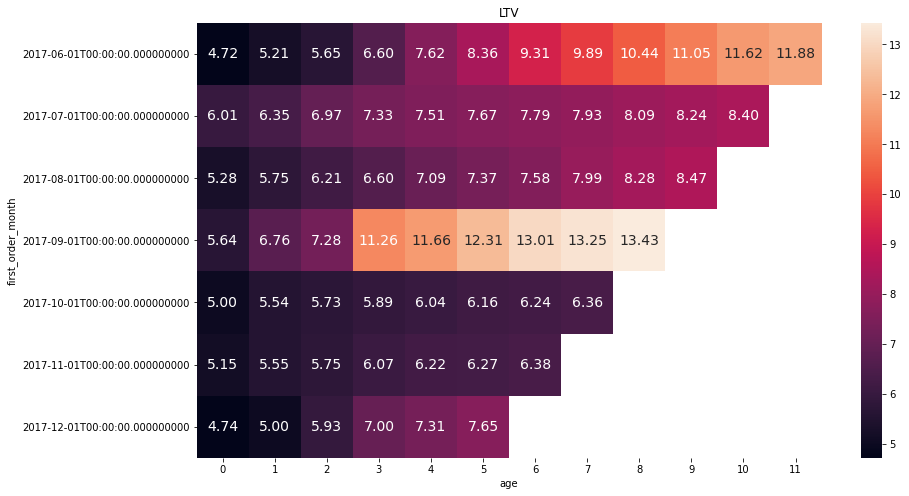

In [66]:
report_pivot = report[report['max_age'] >= 5].pivot_table(
index='first_order_month',
columns='age',
values='ltv',
aggfunc='mean'
).round(2)

fig, ax = plt.subplots(figsize=(14,8))
sns.heatmap(
        report_pivot.cumsum(axis=1), 
        annot = True, 
        fmt='.2f',
        annot_kws={'fontsize':14}
    )
ax.set_title("LTV");

Самая успешная когорта - сентябрьская, у нее максимальный LTV 9-ти месяцев.

Расчитаем средний LTV по всем когортам, просуществовавшим от 6 мес и более

In [67]:
mean_ltv = report_pivot.cumsum(axis=1).mean(axis=0).fillna('').reset_index()
mean_ltv.columns = ['cohort_age', 'mean_ltv']
mean_ltv.round(2)

print(f"Cредний пользователь приносит сервису за 6 месяцев {mean_ltv['mean_ltv'][5].round(2)} у.е.")

,cohort_age,mean_ltv
0,0,5.22
1,1,5.74
2,2,6.22
3,3,7.25
4,4,7.64
5,5,7.97
6,6,8.38
7,7,9.08
8,8,10.06
9,9,9.25


Cредний пользователь приносит сервису за 6 месяцев 7.97 у.е.


В таблице `mean_ltv` представлен размер прибыли, которую приносит средний пользователь на 1-ый, 2-ой и т.д. (до 12-го месяца включительно) месяц пользования сервисом. 

За 6 месяцев этот показатель составит 7.97 у.е.

Посмотрим на динамику показателя

In [68]:
lineplot(mean_ltv, 'cohort_age', 'mean_ltv')

В целом наблюдается стабильная положительная динамика метрики LTV. Небольшое проседание наблюдается после 9 месяцев жизни когорт (из расчета выходит когорта сентября 2017 с высокими показателями LTV).

Итак, мы расчитали несколько важных метрик: среднее время от первого входа на сайт до первой покупки, количество покупок на пользователя, размер среднего чека и прибыль, которую компания получает с клиента на определенный месяц его "жизни" на сайте. Работа над улучшением данных метрик напрямую влияет на размер получаемой компанией прибыли. Так, увеличение LTV ускорит окупаемость инвестиций, а значит и развитие бизнеса в целом. 

## Маркетинговые метрики

### Расходы по источникам привлечения

In [69]:
costs.head()

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [70]:
total_costs = costs['costs'].sum()
total_costs

329131.62

Расходы на маркетинг за год составили 329131 у.е. Посмотрим как расходы распределены по источникам привлечения клиентов

In [71]:
costs['source_id'].unique()
costs_by_source = (
    costs.groupby('source_id')['costs']
    .agg({'count', 'sum', 'mean'})
    .sort_values(by='sum', ascending=False)
)

costs_by_source['share'] = costs_by_source['sum'] / total_costs
costs_by_source.round(2).style.background_gradient(cmap='nipy_spectral_r')

array([ 1,  2,  3,  4,  5,  9, 10], dtype=int64)

,count,mean,sum,share
source_id,,,,
3,363,389.320000,141321.630000,0.430000
4,363,168.250000,61073.600000,0.190000
5,364,142.190000,51757.100000,0.160000
2,363,117.920000,42806.040000,0.130000
1,363,57.390000,20833.270000,0.060000
10,363,16.040000,5822.490000,0.020000
9,363,15.200000,5517.490000,0.020000


В исследуемом периоде расходы осуществлялись по 7 источникам привлечения: коды источников от 1 до 10, за исключением №№ 6, 7 и 8. По каждому из источников количество платежей равно 363, по источнику 5 - 364. Вероятно, речь идет о ежедневных платежах в течение года. Проверим эту версию на примере источника 1.

In [72]:
costs[costs['source_id'] == 1]['dt'].nunique()

363

Предположение подтвердилось - по источнику 1 мы наблюдаем 363 уникальных значения даты платежа.  
Посмотрим распределение затрат на круговой диаграмме

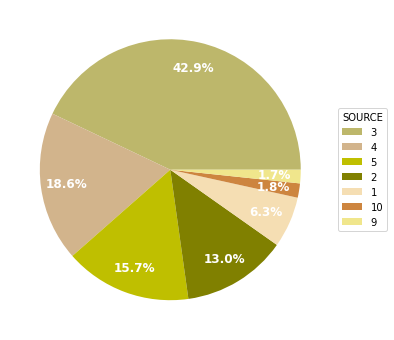

In [73]:
my_colors={'tan','darkkhaki','khaki', 'wheat', 'y', 'peru', 'olive'}
fig, axes = plt.subplots(figsize=(6, 6))
axes.pie(
    costs_by_source['share'], 
    autopct="%.1f%%", 
    labels=costs_by_source.index, 
    colors=my_colors,
    textprops={'color':"w", 'fontsize':12, 'weight': 'bold'},
    pctdistance=0.8   
    )

axes.legend(
    title='SOURCE', 
    loc='center left', 
    bbox_to_anchor=(1, 0, 0.5, 1)
    )

plt.show();

На источник №3 в исследуемом периоде было потрачено наибольшее количество денег - 141322 условных единиц (доля в общих расходах почти 43%), минимальные расходы - на источники №№ 9 и 10 (чуть более 5.5 тысяч, совокупная доля не более 3.5%). Доля источников 2 и 5 примерно равна - 13 и 15.7% соответственно, источник №4 - 18.6% 

Сгруппируем затраты на маркетинг по месяцам и посмотрим на динамику по каждому из источников

In [74]:
costs['month'] = costs['dt'].astype('datetime64[M]')
costs_grouped = costs.groupby(['month', 'source_id'])['costs'].sum().reset_index()
costs_grouped

,month,source_id,costs
0,2017-06-01,1,1125.61
1,2017-06-01,2,2427.38
2,2017-06-01,3,7731.65
3,2017-06-01,4,3514.80
4,2017-06-01,5,2616.12
...,...,...,...
79,2018-05-01,3,9411.42
80,2018-05-01,4,4214.21
81,2018-05-01,5,3669.56
82,2018-05-01,9,362.17


In [75]:
fig = px.line(costs_grouped, x="month", y="costs", color='source_id')
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.5, y=1.05,
                              xanchor='center', yanchor='bottom',
                              text='COSTS BY SOURCE IN DYNAMICS',
                              font=dict(family='Arial',
                                        size=25,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig.show();

Расходы по источникам 9 и 10 небольшие и стабильные от месяца к месяцу. Расходы на источники 1, 2 и 5 увеличивались с августа по ноябрь 2017 и далее постепенно снижались, но не ниже значений июня 2017. Интересно ведет себя источник № 4: общая тенденция похожа на источники 1, 2 и 5, но динамика рваная, от месяца к месяцу расходы то увеличиваются, то снова снижаются.

Самый большой интерес в нашем исследовании представляет источник № 3. Начиная с августа 2017 года мы наблюдаем значительное увеличение расходов с пиком в ноябре, и до самого конца исследуемого периода расходы на привлечение клиентов из данного источника продолжают оставаться намного выше, чем по другим источникам. Возможно, мероприятия, осуществляемые в ноябре, стали причиной пика посещаемости сайта 24.11.2017 года.

### CAC

Для расчета стоимости привлечения одного платящего пользователя нам потребуются суммарные месячные расходы

In [76]:
monthly_costs = costs.groupby('month')['costs'].sum().reset_index()
monthly_costs

,month,costs
0,2017-06-01,18015.00
1,2017-07-01,18240.59
2,2017-08-01,14790.54
3,2017-09-01,24368.91
4,2017-10-01,36322.88
5,2017-11-01,37907.88
6,2017-12-01,38315.35
7,2018-01-01,33518.52
8,2018-02-01,32723.03
9,2018-03-01,30415.27


In [77]:
report.head()

,first_order_month,order_month,n_orders,n_buyers,age,orders_per_buyer,revenue,gross_profit,ltv,max_age
0,2017-06-01,2017-06-01,2354,2023,0,1.16,9557.49,9557.49,4.724414,11
1,2017-06-01,2017-07-01,177,2023,1,0.09,981.82,981.82,0.485329,11
2,2017-06-01,2017-08-01,174,2023,2,0.09,885.34,885.34,0.437637,11
3,2017-06-01,2017-09-01,226,2023,3,0.11,1931.30,1931.30,0.954671,11
4,2017-06-01,2017-10-01,292,2023,4,0.14,2068.58,2068.58,1.022531,11


Ранее мы считали количество уникальных пользователей в каждой когорте в каждый месяц ее жизни. Данный показатель для расчета CAC нам не подходит - нам нужно число "первичных" уникальных пользователей в когорте.

In [78]:
cohort_buyers = ord.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_buyers.columns = ['first_order_month', 'cohort_buyers']
report = pd.merge(report, cohort_buyers, on='first_order_month')
report.head()

,first_order_month,order_month,n_orders,n_buyers,age,orders_per_buyer,revenue,gross_profit,ltv,max_age,cohort_buyers
0,2017-06-01,2017-06-01,2354,2023,0,1.16,9557.49,9557.49,4.724414,11,2023
1,2017-06-01,2017-07-01,177,2023,1,0.09,981.82,981.82,0.485329,11,2023
2,2017-06-01,2017-08-01,174,2023,2,0.09,885.34,885.34,0.437637,11,2023
3,2017-06-01,2017-09-01,226,2023,3,0.11,1931.30,1931.30,0.954671,11,2023
4,2017-06-01,2017-10-01,292,2023,4,0.14,2068.58,2068.58,1.022531,11,2023


Добавим в отчет месячные затраты и расчитаем месячную стоимость привлечения клиента (CAC) как отношение затрат и количества платящих клиентов в когорте

In [79]:
report = pd.merge(report, monthly_costs, left_on='first_order_month', right_on='month')

report['cac'] = report['costs'] / report['cohort_buyers']
report.head()

,first_order_month,order_month,n_orders,n_buyers,age,orders_per_buyer,revenue,gross_profit,ltv,max_age,cohort_buyers,month,costs,cac
0,2017-06-01,2017-06-01,2354,2023,0,1.16,9557.49,9557.49,4.724414,11,2023,2017-06-01,18015.0,8.905091
1,2017-06-01,2017-07-01,177,2023,1,0.09,981.82,981.82,0.485329,11,2023,2017-06-01,18015.0,8.905091
2,2017-06-01,2017-08-01,174,2023,2,0.09,885.34,885.34,0.437637,11,2023,2017-06-01,18015.0,8.905091
3,2017-06-01,2017-09-01,226,2023,3,0.11,1931.30,1931.30,0.954671,11,2023,2017-06-01,18015.0,8.905091
4,2017-06-01,2017-10-01,292,2023,4,0.14,2068.58,2068.58,1.022531,11,2023,2017-06-01,18015.0,8.905091


Сгруппируем данные помесячно

In [80]:
cac = report.groupby('first_order_month')['costs', 'cohort_buyers', 'cac'].agg({'cac':'mean'}).reset_index()
cac['first_order_month'] = cac['first_order_month'].dt.strftime('%Y-%m')
cac.round(2).style.background_gradient(cmap='mako_r')

C:\Users\Huawei\AppData\Local\Temp/ipykernel_3372/3233141317.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,first_order_month,cac
0,2017-06,8.910000
1,2017-07,9.490000
2,2017-08,10.800000
3,2017-09,9.440000
4,2017-10,8.370000
5,2017-11,9.290000
6,2017-12,8.740000
7,2018-01,9.940000
8,2018-02,8.960000
9,2018-03,8.610000


Максимальная стоимость привлечения клиента была в августе 2017 года (при этом как затраты, так и количество платящих пользователей в этом месяце были минимальными), дешевле всего сервису обошлись клиенты мая 2018 года.

В 4 квартале 2017 года затраты на маркетинг были максимальными, при этом и количество платящих пользователей в эти месяцы также самое большое.

Для выстраивания эффективной маркетинговой политики необходимо стремиться к тому, чтобы при низких затратах на маркетинг мы получали одновременное увеличение количества платящих пользователей. Чем ниже показатель CAC, тем лучше. Для сравнения можно посмотреть на апрель и май 2018 года. В мае затраты на привлечение клиента сопоставимы с апрельскими, а клиентов пришло больше, поэтому стоимость привлечения в мае получилась минимальная.

### CAC по источникам привлечения

В датасете `orders` информация о канале привлечения отсутствует - мы не знаем, какой именно источник побудил клиента совершить первую покупку. Поэтому в качестве основного источника привлечения мы выберем тот канал, откуда пользователь совершил свой самый первый переход на сайт. Колонку с источником добавим в датафрейм с заказами

In [81]:
main_source = vis[vis['start_ts'] == vis['first_session_ts']][['uid', 'source_id']]
main_source.columns = ['uid', 'main_source']
main_source.head()

ord = ord.merge(main_source, on='uid', how='left')
ord.sample(5)

,uid,main_source
0,11863502262781,3
1,49537067089222,2
2,297729379853735,3
4,313578113262317,2
6,325320750514679,5


,buy_ts,revenue,uid,first_order_ts,first_order_dt,first_order_month,first_session_ts,first_session_dt,days_to_first_order,order_month,main_source
30469,2017-12-28 11:09:00,3.05,6559181660205799484,2017-12-28 11:09:00,2017-12-28,2017-12-01,2017-12-28 11:01:00,2017-12-28,0,2017-12-01,5
28667,2017-12-17 23:09:00,0.98,6919948020447197875,2017-12-17 23:09:00,2017-12-17,2017-12-01,2017-11-25 22:59:00,2017-11-25,22,2017-12-01,4
43013,2018-03-22 09:24:00,2.92,903888275735815131,2018-03-22 09:24:00,2018-03-22,2018-03-01,2017-11-29 22:37:00,2017-11-29,112,2018-03-01,4
23254,2017-11-24 18:01:00,2.20,18295771519195086861,2017-11-24 15:47:00,2017-11-24,2017-11-01,2017-11-19 15:18:00,2017-11-19,5,2017-11-01,3
30247,2017-12-27 10:53:00,5.50,6661955166811416225,2017-12-27 10:53:00,2017-12-27,2017-12-01,2017-12-27 10:44:00,2017-12-27,0,2017-12-01,3


Для каждой когорты и источника привлечения расчитаем количество платящих пользователей

In [82]:
n_buyers_by_source = (
    ord.groupby(['first_order_month', 'main_source']).agg({'uid': 'nunique'}).reset_index()
)
n_buyers_by_source.columns = ['first_order_month', 'main_source', 'cohort_buyers']
n_buyers_by_source

,first_order_month,main_source,cohort_buyers
0,2017-06-01,1,190
1,2017-06-01,2,235
2,2017-06-01,3,638
3,2017-06-01,4,413
4,2017-06-01,5,384
...,...,...,...
81,2018-05-01,4,804
82,2018-05-01,5,497
83,2018-05-01,9,60
84,2018-05-01,10,130


Создадим отчет, в котором для каждой когорты и каждого источника привлечения расчитаем суммарную выручку, и добавим в полученную таблицу количество платящих пользователей

In [83]:
report_by_source = ord.groupby(['first_order_month', 'order_month', 'main_source']).agg({'revenue':'sum'}).reset_index()
report_by_source = report_by_source.merge(n_buyers_by_source, on=['first_order_month', 'main_source'])
report_by_source.head()

,first_order_month,order_month,main_source,revenue,cohort_buyers
0,2017-06-01,2017-06-01,1,1378.70,190
1,2017-06-01,2017-07-01,1,414.98,190
2,2017-06-01,2017-08-01,1,419.43,190
3,2017-06-01,2017-09-01,1,714.24,190
4,2017-06-01,2017-10-01,1,811.20,190


Добавим в отчет валовую прибыль, LTV и возраст каждой когорты

In [84]:
report_by_source['gross_profit'] = report_by_source['revenue'] * margin_rate
report_by_source['ltv'] = report_by_source['gross_profit'] / report_by_source['cohort_buyers']
report_by_source['age'] = (report_by_source['order_month'] - report_by_source['first_order_month']) / np.timedelta64(1, 'M')
report_by_source['age'] = report_by_source['age'].round().astype('int')
report_by_source.head()

,first_order_month,order_month,main_source,revenue,cohort_buyers,gross_profit,ltv,age
0,2017-06-01,2017-06-01,1,1378.70,190,1378.70,7.256316,0
1,2017-06-01,2017-07-01,1,414.98,190,414.98,2.184105,1
2,2017-06-01,2017-08-01,1,419.43,190,419.43,2.207526,2
3,2017-06-01,2017-09-01,1,714.24,190,714.24,3.759158,3
4,2017-06-01,2017-10-01,1,811.20,190,811.20,4.269474,4


Расчитаем ежемесячные расходы, стоимость привлечения клиента (CAC) и коэффициент возврата инвестиций в маркетинг (ROMI) для каждого месяца и каждого источника привлечения

In [85]:
costs_by_source = costs.groupby(['month', 'source_id'])['costs'].sum().reset_index()

report_by_source = pd.merge(
    report_by_source, 
    costs_by_source, 
    left_on=['first_order_month', 'main_source'], 
    right_on=['month', 'source_id']
)

report_by_source.head()

,first_order_month,order_month,main_source,revenue,cohort_buyers,gross_profit,ltv,age,month,source_id,costs
0,2017-06-01,2017-06-01,1,1378.70,190,1378.70,7.256316,0,2017-06-01,1,1125.61
1,2017-06-01,2017-07-01,1,414.98,190,414.98,2.184105,1,2017-06-01,1,1125.61
2,2017-06-01,2017-08-01,1,419.43,190,419.43,2.207526,2,2017-06-01,1,1125.61
3,2017-06-01,2017-09-01,1,714.24,190,714.24,3.759158,3,2017-06-01,1,1125.61
4,2017-06-01,2017-10-01,1,811.20,190,811.20,4.269474,4,2017-06-01,1,1125.61


In [86]:
report_by_source['cac'] = report_by_source['costs'] / report_by_source['cohort_buyers']
report_by_source['romi'] = report_by_source['ltv'] / report_by_source['cac']
report_by_source.head()

,first_order_month,order_month,main_source,revenue,cohort_buyers,gross_profit,ltv,age,month,source_id,costs,cac,romi
0,2017-06-01,2017-06-01,1,1378.70,190,1378.70,7.256316,0,2017-06-01,1,1125.61,5.924263,1.224847
1,2017-06-01,2017-07-01,1,414.98,190,414.98,2.184105,1,2017-06-01,1,1125.61,5.924263,0.368671
2,2017-06-01,2017-08-01,1,419.43,190,419.43,2.207526,2,2017-06-01,1,1125.61,5.924263,0.372625
3,2017-06-01,2017-09-01,1,714.24,190,714.24,3.759158,3,2017-06-01,1,1125.61,5.924263,0.634536
4,2017-06-01,2017-10-01,1,811.20,190,811.20,4.269474,4,2017-06-01,1,1125.61,5.924263,0.720676


Расчитаем стоимость привлечения клиента по месяцам для каждого источника привлечения. Для удобства восприятия информации используем тепловую карту

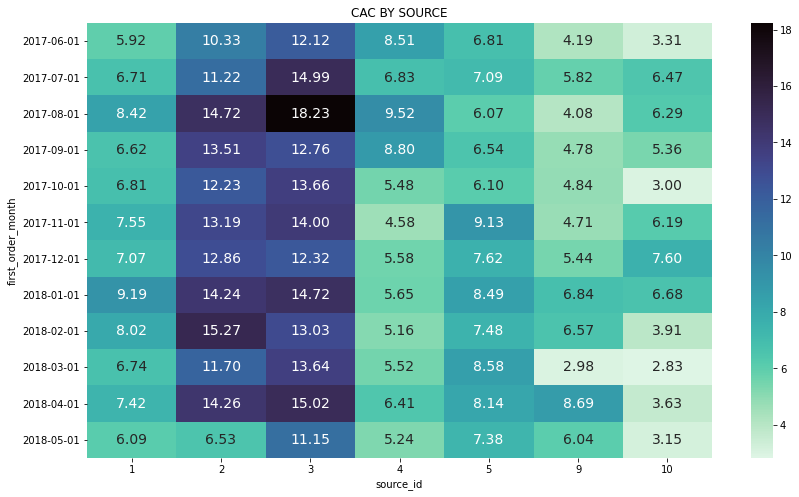

In [87]:
report_by_source_pivot = report_by_source.pivot_table(
index='first_order_month',
columns='source_id',
values='cac',
aggfunc='mean'
).round(2)

fig, ax = plt.subplots(figsize=(14,8))

sns.heatmap(
    report_by_source_pivot, 
    annot = True, 
    cmap='mako_r',
    fmt='.2f',
    annot_kws={'fontsize':14}
)
ax.set_title("CAC BY SOURCE")
ticklabels = [report_by_source_pivot.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels);

Итак, на тепловой карте видно, что минимальная стоимость привлечения клиента по источникам была в следующих месяцах: 

Источник №1 - июнь 2017  
Источник №2 - май 2018  
Источник №3 - май 2018  
Источник №4 - ноябрь 2017  
Источник №5 - август 2017  
Источник №9 - март 2018  
Источник №10 - март 2018  

Напомним, что ранее для всех пользователей без учета источника привлечения мы получили минимальные значения метрики CAC для мая 2018 года.

Посмотрим среднюю стоимость привлечения клиента за год

In [88]:
report_by_source_pivot.mean(axis=0).reset_index()

,source_id,0
0,1,7.213333
1,2,12.505000
2,3,13.803333
3,4,6.440000
4,5,7.452500
5,9,5.415000
6,10,4.868333


Самая высокая средняя стоимость привлечения клиента - у канала №3, самая низкая - у канала № 10 и № 9. Последние источники стоит изучить более детально - масштабирование этих каналов может дать значительное увеличение выручки.

Аналогично с каналами 2 и 3 - может быть, стоит рассмотреть снижение маркетинговых расходов для этих источников.

Давайте узнаем какие каналы приносят нам больше выручки. Для этого мы сгруппируем клиентов по источнику привлечения, расчитаем количество клиентов и общую выручку

In [89]:
revenue_by_source = ord.groupby('main_source').agg({'uid':'nunique', 'revenue':'sum'}).round(0).reset_index()
revenue_by_source.columns = ['main_source', 'buyers', 'revenue']

revenue_by_source.style.background_gradient(cmap = 'mako_r')

,main_source,buyers,revenue
0,1,2899,31091.000000
1,2,3506,46924.000000
2,3,10473,54511.000000
3,4,10296,56697.000000
4,5,6931,52624.000000
5,7,1,1.000000
6,9,1088,5759.000000
7,10,1329,4450.000000


Основную выручку сервису приносят клиенты, пришедшие из каналов 3, 4 и 5. Получается, что канал №3, несмотря на высокую стоимость привлечения клиента, генерит самое большой трафик и практически самую большую выручку. Для принятия решения по данному каналу необходимо оценить качество трафика (сделаем это ниже при расчете ROMI).

Канал № 7 принес нам только одного платящего пользователя за год, но компания не несет затрат на рекламу в этом канале.

Каналы № 9 и 10 отстают от остальных как по количеству новых клиентов, так и по выручке.

Теперь изучим изменение метрики CAC в динамике

In [90]:
def value_by_source_in_dynamics(df, value):
    fig = px.line(df, x="first_order_month", y=value, color='source_id')
    annotations = []
    annotations.append(dict(xref='paper', yref='paper', x=0.5, y=1.05,
                              xanchor='center', yanchor='bottom',
                              text=f'{value} by source in dynamics',
                              font=dict(family='Arial',
                                        size=25,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
    fig.update_layout(annotations=annotations)
    fig.show();

In [91]:
value_by_source_in_dynamics(report_by_source, 'cac')

Динамика CAC для разных каналов привлечения имеет схожие паттерны: привлечение обходится дороже в августе 2017 и апреле 2018, дешевле в июне 2017 и мае 2018.

Таким образом, изучив стоимость привлечения клиента в разрезе источника, мы можем порекомендовать отделу маркетинга рассмотреть возможность масштабирования рекламных компаний для каналов 9 и 10, так как там самая низкая стоимость привлечения клиента. Выводы по каналу №3 мы сделаем позднее после оценки качества трафика.

### ROMI по источникам привлечения

In [92]:
romi_by_source = report_by_source.groupby(['first_order_month', 'age', 'source_id'])['romi'].mean().reset_index()
romi_by_source.head()

,first_order_month,age,source_id,romi
0,2017-06-01,0,1,1.224847
1,2017-06-01,0,2,0.429962
2,2017-06-01,0,3,0.362709
3,2017-06-01,0,4,0.557596
4,2017-06-01,0,5,0.725842


Чтобы детально изучить каждый канал привлечения, создадим функцию, которая считает окупаемость вложений в маркетинг для каждой когорты в каждый месяц ее жизни (ROMI накопительным итогом) и средний ROMI по всем когортам, и выводит график динамики среднего значения окупаемости

In [93]:
def romi_by_source_pivot(value):
    romi_by_source_pivot = (romi_by_source[romi_by_source['source_id'] == value]).pivot_table(
    index='first_order_month',
    columns='age',
    values='romi',
    aggfunc='mean'
    )
    
    romi_by_source_pivot.index = [str(x)[0:10] for x in romi_by_source_pivot.index]
    
    romi_by_source_pivot.cumsum(axis=1).fillna('')
    
    fig, ax = plt.subplots(figsize=(14,8))

    sns.heatmap(
        romi_by_source_pivot.cumsum(axis=1), 
        annot = True, 
        cmap='gist_heat_r',
        fmt='.2f',
        annot_kws={'fontsize':14, 'fontstyle':'oblique'}
    )
    ax.set_title(f"ROMI: SOURCE {value}");
    
    # считаем средний ROMI по всем когортам
    mean_romi = romi_by_source_pivot.cumsum(axis=1).mean(axis=0).fillna('').reset_index()
    mean_romi.columns = ['age', f'mean_romi_{value}']
    display(mean_romi)
    
    # применим созданную в разделе "Продуктовые метрики" функцию для линейного графика
    lineplot(mean_romi, 'age', f'mean_romi_{value}')

Применим функцию последовательно к каждому каналу привлечения

#### Источник 1

,age,mean_romi_1
0,0,0.892768
1,1,1.048742
2,2,1.258675
3,3,1.363425
4,4,1.565990
5,5,1.768576
6,6,2.038114
7,7,2.362370
8,8,2.860597
9,9,3.462846


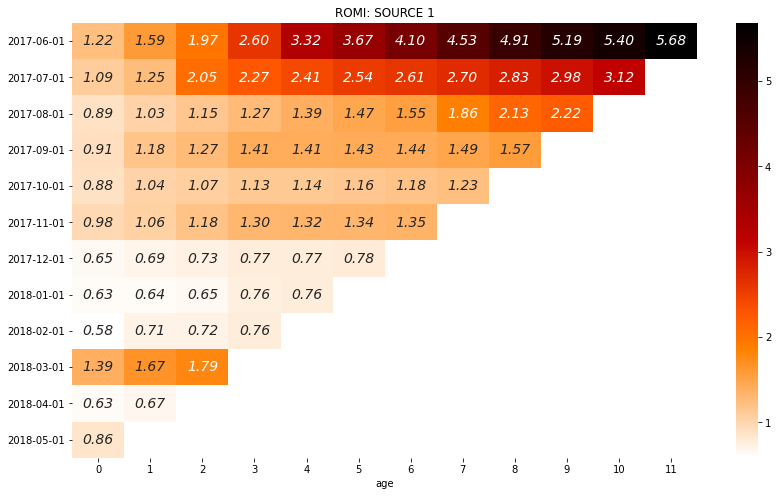

In [94]:
romi_by_source_pivot(1)

Для канала №1 инвестиции в маркетинг окупились ко второму месяцу только для когорт июня и июля 2017, а также марта 2018. 

В бизнесе традиционно нормой считается значение ROMI от 3 и выше. Это значит, что каждый вложенный рубль приносит компании 3 рубля прибыли. Самые лучшие показатели и июньской когорты - уже через пять месяцев с даты первой покупки показатель ROMI достиг значения 3.32, а к концу года - 5.68.

В целом по тепловой карте видно, что качество трафика из источника № 1 в конце 2017 года было лучше, чем в первой половине 2018.

Если смотреть на усредненные показатели по всем когортам, то вложения в маркетинг окупились на второй месяц. Динамика роста показателя ровная.

#### Источник 2

,age,mean_romi_2
0,0,0.549286
1,1,0.630051
2,2,0.777428
3,3,0.939189
4,4,1.085749
5,5,1.229496
6,6,1.029998
7,7,1.140317
8,8,1.215401
9,9,0.994079


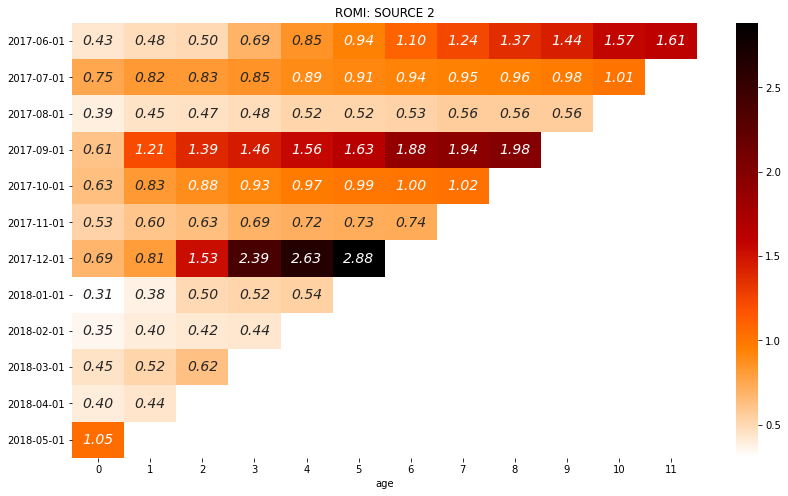

In [95]:
romi_by_source_pivot(2)

Качество трафика, привлекаемого из источника № 2 чуть хуже - по итогам первого места на окупаемость вышла только когорта мая 2018. Через два месяца после первой покупки также окупилось привлечение когорты сентября 2017.

Хорошая динамика у ROMI когорты декабря 2017 года - за полгода показатель достиг максимального значения 2.88 (достаточно резкий скачок вверх произошел после 3 месяцев пользования сервисом).

По итогам года окупились только половина из всех исследуемых когорт.

Динамика роста среднего показателя по когортам неравномерная - заметны падения после 6-го и 9-го месяца. В среднем все когорты вышли на окупаемость по истечении 5 месяцев.

#### Источник 3

,age,mean_romi_3
0,0,0.336151
1,1,0.357750
2,2,0.367152
3,3,0.379767
4,4,0.394988
5,5,0.413851
6,6,0.423732
7,7,0.442706
8,8,0.454574
9,9,0.429613


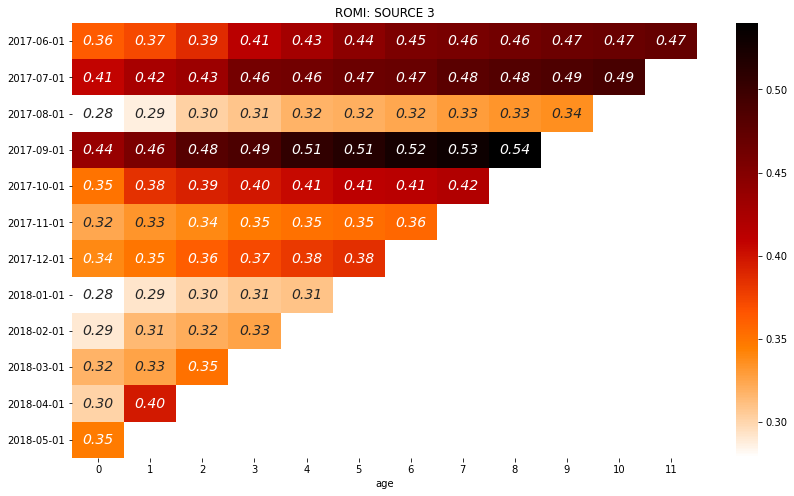

In [96]:
romi_by_source_pivot(3)

Ни одна их когорт, привлеченных из канала №3, не смогла за 12 месяцев окупить вложенные в маркетинг средства. У всех когорт крайне медленная динамика, на фоне других немного выделяется когорта сентября 2017 с максимальным ROMI 0.54.

В среднем по всем когортам максимальный показатель окупаемости - 0.47 - даже половина всех вложений в рекламу не окупились за год.

#### Источник 4

,age,mean_romi_4
0,0,0.757409
1,1,0.776915
2,2,0.791630
3,3,0.814921
4,4,0.843845
5,5,0.900297
6,6,0.980375
7,7,0.900496
8,8,0.904477
9,9,0.952753


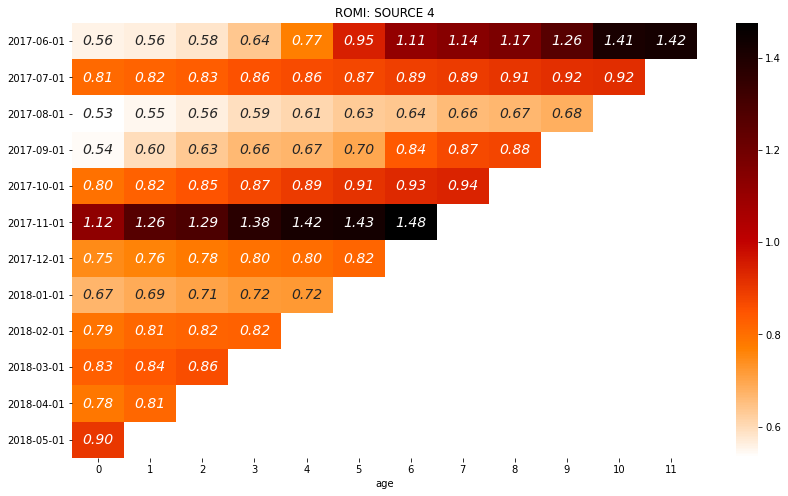

In [97]:
romi_by_source_pivot(4)

Привлечение клиентов из источника № 4 по итогам первого месяца окупилось только для когорты ноября 2017. По итогам года добавилась еще июньская когорта, по остальным точка окупаемости инвестиций в маркетинг так и не была пройдена.

Средний ROMI по всем когортам выше, чем для источника №3, окупаемость достигнута к 11-му месяцу.
В первые месяцы показатель растет достаточно медленно, после 7 месяцев наблюдается небольшое снижение до уровня 5-го месяца, и после 9 месяцев рост ускоряется.

#### Источник 5

,age,mean_romi_5
0,0,0.664923
1,1,0.718179
2,2,0.779610
3,3,1.111582
4,4,1.231647
5,5,1.387731
6,6,1.549131
7,7,1.783598
8,8,2.016601
9,9,1.415622


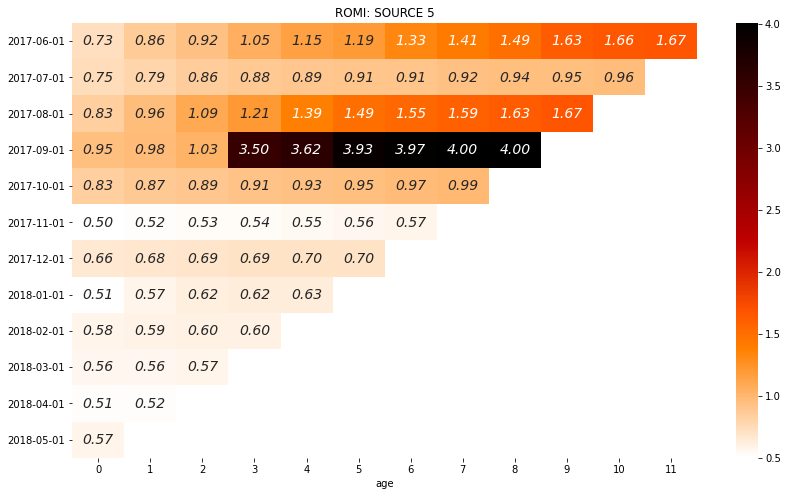

In [98]:
romi_by_source_pivot(5)

Среди клиентов, пришедших из источника №5, выделяется когорта сентября 2017. Расходы на привлечение этой когорты окупились на третий месяц пользования сервисом, а по истечении 9 месяцев каждый вложенный рубль приносил уже 4 рубля прибыли. Остальные когорты чуть слабее - к концу исследуемого периода вышли на окупаемость только когорта июня и августа 2017, близки к окупаемости когорты июля и октября.

Средний ROMI по всем когортам достиг единицы к четвертому месяцу (во многом благодаря когорте сентября). Через 9 месяцев вложения в маркетинг окупились в двойном размере, однако в следующие 3 месяца наблюдалась отрицательная динамика - средний ROMI упал до 1.4 и к концу года достиг 1.7

In [99]:
romi_by_source.query('source_id in [6-8]')
costs['source_id'].unique()

,first_order_month,age,source_id,romi


array([ 1,  2,  3,  4,  5,  9, 10], dtype=int64)

ROMI по источникам 6, 7 и 8 отсутствует, так как в исследуемом периоде не было расходов по данным источникам

#### Источник 9

,age,mean_romi_9
0,0,0.774013
1,1,0.847641
2,2,0.943664
3,3,1.041018
4,4,1.086613
5,5,1.216218
6,6,1.331051
7,7,1.455936
8,8,1.559885
9,9,1.428569


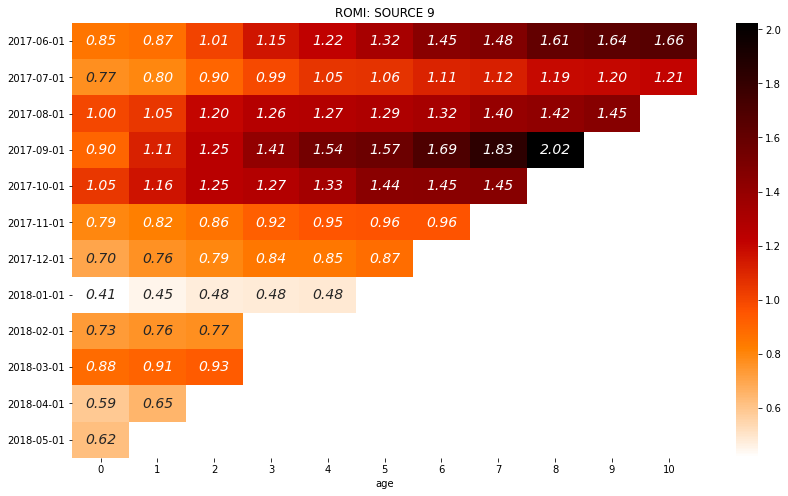

In [100]:
romi_by_source_pivot(9)

Для источника №9 характерно достаточно высокое качество трафика, привлеченного с июня по декабрь 2017 года. Эти когорты к концу года полностью окупились или близки к точке окупаемости. На общем фоне выделяется когорта сентября 2017 года - через 9 месяцев с даты первой покупки доход в два раза превысил расходы на рекламу.

В среднем все когорты окупились к четвертому месяцу, динамика роста показателя достаточно ровная, за исключением небольшого проседания в последние 2 месяца

#### Источник 10

,age,mean_romi_10
0,0,0.727377
1,1,0.708520
2,2,0.765743
3,3,0.685040
4,4,0.737312
5,5,0.754071
6,6,0.876620
7,7,0.773929
8,8,0.608024
9,9,0.899557


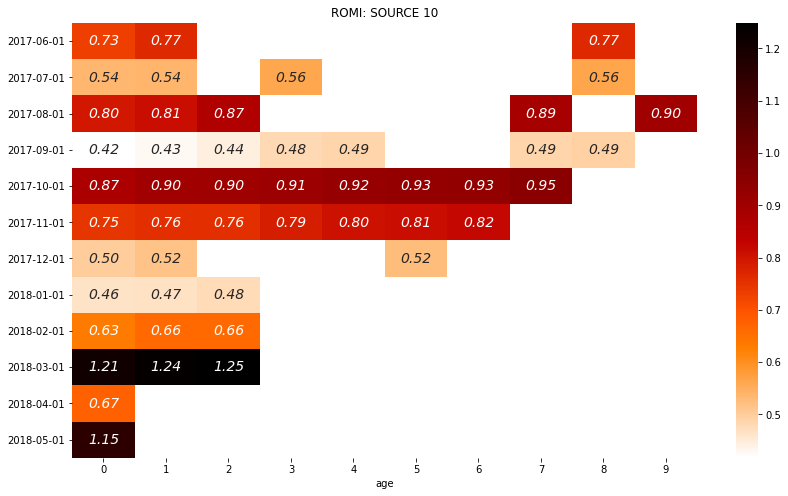

In [101]:
romi_by_source_pivot(10)

In [102]:
revenue_by_source

,main_source,buyers,revenue
0,1,2899,31091.0
1,2,3506,46924.0
2,3,10473,54511.0
3,4,10296,56697.0
4,5,6931,52624.0
5,7,1,1.0
6,9,1088,5759.0
7,10,1329,4450.0


Из канала №10 было привлечено не так много клиентов, общая выручка по ним минимальна. Эти клиенты не каждый месяц совершали покупки, поэтому на тепловой карте мы видим много пропущенных значений - данных недостаточно для заполнения всех клеток.

В отличие от прочих рассмотренных ранее источников, №10 генерит более качественный трафик в марте и мае 2018 года - эти когорты окупили свое привлечение уже в первый месяц жизни. Близка к порогу окупаемости также когорта октября 2017 года, однако судя по динамике, ей понадобится еще как минимум несколько месяцев для достижения целевого показателя.

В целом средний ROMI по всем когортам по итогам 12 месяцев не достиг единицы - расходы на привлечение клиентов не окупились.

#### Сравнение окупаемости источников

Сравним источники по окупаемости вложений в маркетинг на 6-ой месяц пользования сервисом. 

Используем для этого функцию, которая на вход получает номер месяца жизни когорты, для каждого источника строит сводную таблицу со средним накопительным ROMI для каждого месяца жизни когорт, вычленяет значение нужного месяца и на выходе возвращает таблицу с номерами каналов привлечения и значениями ROMI нужного месяца.

In [103]:
def romi_6m_list(age):
    values = []
    index = []
    for i in romi_by_source['source_id'].unique():
        romi_by_source_pivot_1 = (romi_by_source[romi_by_source['source_id'] == i]).pivot_table(
        index='first_order_month',
        columns='age',
        values='romi',
        aggfunc='mean'
        )

        index.append(i)
        values.append(romi_by_source_pivot_1.cumsum(axis=1).mean(axis=0).fillna('')[age].round(2))
        df = pd.DataFrame(data=values, index = index, columns=[f'mean_romi_{age + 1}m'])
    return df.sort_values(by=f'mean_romi_{age + 1}m', ascending=False)

romi_6m_list(5)

,mean_romi_6m
1,1.77
5,1.39
2,1.23
9,1.22
4,0.90
10,0.75
3,0.41


По итогам шести месяцев пользования сервисом лучший показатель окупаемости у источника №1. Далее по убыванию следуют 5, 2 и 9 (точка окупаемости у всех пройдена, средний ROMI > 1). Расходы на рекламные кампании для каналов 3, 4 и 10 за полгода не окупились.

Итак, в данном разделе мы детально изучили стоимость привлечения клиента из каждого источника и окупаемость инвестиций в эти источники. Полученные результаты позволяют сделать вывод об эффективности рекламных компаний и принять взвешенное решение о распределении бюджета между различными источниками.

## Общий вывод

Мы проанализировали логи с визитами пользователей на сайт Афиша за период с июня 2017 по июнь 2018 года, информацию о совершенных клиентами покупках, а также затраты на рекламные компании за этот период.

В среднем сайт посещает 908 человек в день (метрика **DAU**). В течение года было два инцидента, которые следует изучить более детально:
- 24 ноября 2017 года наблюдался резкий скачок посещаемости - 3319 человек.
- 31 марта 2018 года - на странице Афиши зафиксирован только 1 пользователь. 

Если пик не повлиял на общую динамику показателя DAU, то после падения 31 марта среднедневное количество пользователей в течение нескольких месяцев не могло восстановиться до прежних значений. Если это была техническая неполадка на сайте, необходимо выяснить причины и проработать способы минимизации риска повторного возникновения события, чтобы снизить репутационные потери и размер упущенной выгоды.

**WAU** (среднее количество пользователей в неделю) - 5 716. Высокие значения наблюдались в период с сентября 2017 по март 2018 года с пиком в конце ноября 2017. Минимальные значения отмечены в конце июля - начале августа.

**MAU** (среднее количество пользователей в месяц) - 23 228. Максимум в ноябре, минимум - в августе. Есть основания полагать, что на изменение метрики оказывает влияние сезонность: поздняя осень и начало зимы - время массовых мероприятий, связанных с празднованием рождества и нового года. Но для более точных выводов необходима выборка за период в несколько лет.

На каждого пользователя в среднем приходится чуть более 1 сессии в день (точнее - 1.08 сессий). Продолжительность сессии - 1 минута, еще по 10% пользователей проводят на сайте 2 минуты либо менее 1 минуты. К сожалению, сама по себе продолжительность сессии без детального анализа воронки продаж, исследования поведения пользователя на сайте и конверсии в покупку несет в себе крайне мало ценной информации.

Для расчета коэффициента удержания пользователей мы применили когортный анализ. Когорты сформированы по месяцу первого посещения сайта. Когорта июня 2017 года пользовалась сервисом дольше всех, и по прошествии года 4.5% первоначальных пользователей все еще сохраняли лояльность - это самый лучший показатель на конец жизни когорты.
По итогам второго месяца самый высокий коэффициент удержания наблюдается у пользователей, пришедших на сайт в сентябре 2017 года (8.5%). Однако спустя 9 месяцев в этой когорте всего 2.3% от первоначального количества пользовались сервисом. В целом заметно, что лояльность пользователей, пришедших на сайт в 2017 году, выше, чем у тех, кто впервые заглянул на страничку Афиши в начале 2018-го. Если смотреть в среднем по всем когортам, то **retention** 2-го месяца - 6.5%, через 6 месяцев - 4% и через 12 - 4.5% (немного подрос за счет когорты мая 2018).

Большинство клиентов (как минимум 65%) делают заказ в тот же день, в который они впервые зашли на сайт. Анализ количества совершенных покупок позволил нам сделать следующие выводы: показатели в когортах 2017 года лучше, чем в когортах 2018. Лидирует по количеству покупок на человека когорта июня 2017. В среднем за 6 месяцев пользования сервисом клиент совершает 1.43 покупок.

**Средний чек** - 5 у.е. Самое высокое значение наблюдалось в декабре 2017 года (5.85), самое низкое - в июне 2017 (4.06)

За 6 месяцев средний пользователь приносит сервису 7.97 у.е. Если рассматривать метрику **LTV** в разрезе когорт, сформированных по месяцу первого заказа, то самой успешной была когорта сентября 2017 года (LTV 9-и месяцев - 13.43). Все исследуемые в данном блоке когорты (те, что прожили не менее 6 месяцев) на старте принесли сервису не менее 4.5 у.е. на платящего пользователя. 

Расходы на маркетинг за год составили 329 131 у.е. Клиенты привлекались из 7 каналов. Вот как распределены затраты на каждый канал:  
- №3 - 43%
- №4 - 18.6%
- №5 - 15.7%
- №2 - 13%
- №1 - 6.3%
- №№ 9 и 10 - 3.5% совокупно
Дороже всего компании обходится канал №3. Причем самые большие траты наблюдались в ноябре 2017 года. Вероятно этим и объясняется ноябрьский пик в метриках DAU, WAU и MAU.

Максимальная стоимость привлечения клиента (метрика **CAC**) была в августе 2017 года (при этом как затраты, так и количество платящих пользователей в этом месяце были минимальными), дешевле всего сервису обошлись клиенты мая 2018 года. Эффекивность проводимой маркетинговой политики наиболее хорошо прослеживается именно в мае 2018. Если сравнить затраты на рекламу в мае и апреле, цифры практически не различаются. Однако количество привлеченных в мае клиентов на 30% выше, чем месяцем ранее, и показатель САС минимальный. В дальнейшем следует стремиться к снижению затрат на привлечение пользователя, либо к увеличению трафика при сохранении уровня затрат.

Самая низкая стоимость привлечения клиента у источников 9 и 10. При этом инвестиции в канал № 9 окупаются уже на четвертый месяц пользования сервисом. Привлечение клиентов из канала №10, к сожалению, не окупились за 12 месяцев.
Привлечение каждого платящего пользователя из канала №3 обходится компании дороже всего. Качество трафика невысокое - у данного канала самый низкий показатель окупаемости инвестиций в маркетинг на 6-ой месяц - 0.41. Для повышения эффективности бизнеса имеет смысл перераспределить рекламные бюджеты между каналом 9 и 3, отдав предпочтение более перспективному девятому.

У каналов 1 и 5 средний показатель CAC и неплохие показатели окупаемости (**ROMI**) - канал №5 окупился на 4 месяц пользования сервисом, №1 - уже на второй, достигнув за 12 месяцев максимального ROMI 5.7. Это означает, что каждый вложенный в рекламу рубль принес компании более 5 рублей прибыли. Как по итогам 6 месяцев, так и по итогам года, канал №1 - самый эффективный. Рекомендуем рассмотреть вопрос об увеличении инвестиций в этот источник.

В данном исследовании мы сравнили окупаемость инвестиций в каналы по итогам 6 месяцев. Наиболее перспективные источники в порядке убывания следующие: 1, 5, 2 и 9. При необходимости можно провести такое сравнение на любой месяц жизненного цикла клиентов, попавших в выборку. Перераспределение рекламных расходов в пользу более эффективных каналов позволит компании увеличить прибыль, получаемую с пользователей сервиса.